# Rainfall Weather Forecasting USING MACHINE LEARNING :
Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.
Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things


# AIM :
a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.
b) Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there

Rainfall Prediction is the application of meteorology and machine learning to predict the amount of rainfall over a region. It is important to exactly determine the rainfall for effective use of water resources, crop productivity and pre-planning of water structures.

Moreover, rainfall greatly affects human life in various sectors such as agriculture and transportation. Additionaly, it can cause natural disasters such as drought, floods, and landslides. The aim of this project is to build an accurate rainfall prediction model so that prescriptive measures can be made.

Governments, communities and individuals spend large amounts of money so that there is enough water available for everyone. Collecting and understanding rainfall data is important so that the right decisions are made.

Rainfall prediction has gained utmost research relevance in recent times due to its complexities and persistent applications such as flood forecasting and monitoring of pollutant concentration levels, among others. Existing models use complex statistical models that are often too costly, both computationally and budgetary, or are not applied to downstream applications. Therefore, approaches that use Machine Learning algorithms in conjunction with time-series data are being explored as an alternative to overcome these drawbacks.

The main objective of this project is to identify the relevant atmospheric features that cause rainfall and predict the intensity of daily rainfall using various machine learning algorithms such as Multivariate Linear Regression (MLR), Multilayer Perceptron Regressor (Neural Network), KNeighbors Regressor, Ridge Regression, Random Forest Regressor, and Support Vector Regression (SVR).

In addition to, the Root Mean Squared Error (RMSE) and Mean Absolute Error (MAE) metrics were used to measure the performance of the machine learning models.

The dataset was collected from Kaggle. It contains meteorological data of Austin, Texas. Further, Austin has a humid subtropical climate, which means it has long, hot summers and typically mild winters. In July and August, high temps often top out at around 100 degrees Fahrenheit (38 degrees Celsius), sometimes for several days in a row. The humidity is usually only at sauna-like levels just before a rainstorm, but even when it’s not raining, the humidity rarely dips below 30 percent.

Therefore, atmospheric features such as temperature, relative humidity, sea level pressure, and wind speed are seen as important features that predict rainfall accurately.

# Importing essential libraries

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import OrdinalEncoder

# Reading csv file

In [3]:
rain_data=pd.read_csv('https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv')
rain_data.head(10).T

,0,1,2,3,4,5,6,7,8,9
Date,2008-12-01,2008-12-02,2008-12-03,2008-12-04,2008-12-05,2008-12-06,2008-12-07,2008-12-08,2008-12-09,2008-12-10
Location,Albury,Albury,Albury,Albury,Albury,Albury,Albury,Albury,Albury,Albury
MinTemp,13.4,7.4,12.9,9.2,17.5,14.6,14.3,7.7,9.7,13.1
MaxTemp,22.9,25.1,25.7,28.0,32.3,29.7,25.0,26.7,31.9,30.1
Rainfall,0.6,0.0,0.0,0.0,1.0,0.2,0.0,0.0,0.0,1.4
Evaporation,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Sunshine,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
WindGustDir,W,WNW,WSW,NE,W,WNW,W,W,NNW,W
WindGustSpeed,44.0,44.0,46.0,24.0,41.0,56.0,50.0,35.0,80.0,28.0
WindDir9am,W,NNW,W,SE,ENE,W,SW,SSE,SE,S


In [20]:
rain_data.shape

(8425, 23)

# Gives informaton of the dataset it's type etc

In [21]:
rain_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

# Checking null values

In [4]:
rain_data.isna().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

# Missing value check

In [23]:
missing_values = rain_data.isna().sum().sort_values(ascending=False)
percentage_missing_values= (missing_values/len(rain_data))*100
print(pd.concat([missing_values,percentage_missing_values], axis=1, keys=['Missing Values','%Missingdata']))

               Missing Values  %Missingdata
Sunshine                 3994     47.406528
Evaporation              3512     41.685460
Cloud3pm                 2455     29.139466
Cloud9am                 2421     28.735905
Pressure3pm              1312     15.572700
Pressure9am              1309     15.537092
WindGustDir               991     11.762611
WindGustSpeed             991     11.762611
WindDir9am                829      9.839763
WindDir3pm                308      3.655786
RainToday                 240      2.848665
Rainfall                  240      2.848665
RainTomorrow              239      2.836795
WindSpeed3pm              107      1.270030
Humidity3pm               102      1.210682
Temp3pm                    96      1.139466
WindSpeed9am               76      0.902077
MinTemp                    75      0.890208
MaxTemp                    60      0.712166
Humidity9am                59      0.700297
Temp9am                    56      0.664688
Location                    0   

# Filling Missing Values

In [5]:
# rain_data['RainTomorrow'].fillna(rain_data['RainTomorrow'].mode()[0],inplace=True)
rain_data['RainToday'].fillna(rain_data['RainToday'].mode()[0],inplace=True)
rain_data['WindGustDir'].fillna(rain_data['WindGustDir'].mode()[0],inplace=True)
rain_data['WindDir9am'].fillna(rain_data['WindDir9am'].mode()[0],inplace=True)
rain_data['WindDir3pm'].fillna(rain_data['WindDir3pm'].mode()[0],inplace=True)
rain_data['Sunshine'].fillna(rain_data['Sunshine'].mode()[0],inplace=True)
rain_data['Evaporation'].fillna(rain_data['Evaporation'].mode()[0],inplace=True)


In [25]:
rain_data['Cloud3pm'].fillna(rain_data['Cloud3pm'].mode()[0],inplace=True)
rain_data['Cloud9am'].fillna(rain_data['Cloud9am'].mode()[0],inplace=True)
rain_data['Pressure3pm'].fillna(rain_data['Pressure3pm'].mode()[0],inplace=True)
rain_data['Pressure9am'].fillna(rain_data['Pressure9am'].mode()[0],inplace=True)
rain_data['WindGustSpeed'].fillna(rain_data['WindGustSpeed'].mode()[0],inplace=True)
rain_data['MinTemp'].fillna(rain_data['MinTemp'].mode()[0],inplace=True)
rain_data['Humidity9am'].fillna(rain_data['Humidity9am'].mode()[0],inplace=True)
rain_data['Temp9am'].fillna(rain_data['Temp9am'].mode()[0],inplace=True)
rain_data['Humidity3pm'].fillna(rain_data['Humidity3pm'].mode()[0],inplace=True)
rain_data['Rainfall'].fillna(rain_data['Rainfall'].mode()[0],inplace=True)
rain_data['MaxTemp'].fillna(rain_data['MaxTemp'].mode()[0],inplace=True)
rain_data['WindSpeed3pm'].fillna(rain_data['WindSpeed3pm'].mode()[0],inplace=True)
rain_data['Temp3pm'].fillna(rain_data['Temp3pm'].mode()[0],inplace=True)
rain_data['WindSpeed9am'].fillna(rain_data['WindSpeed9am'].mode()[0],inplace=True)

Here we are using Mode to fill the missing values
The mode is the number in a set of numbers that appears the most often

In [26]:
missing_values = rain_data.isna().sum().sort_values(ascending=False)
percentage_missing_values= (missing_values/len(rain_data))*100
print(pd.concat([missing_values,percentage_missing_values], axis=1, keys=['Missing Values','%Missingdata']))

               Missing Values  %Missingdata
Date                        0           0.0
WindSpeed3pm                0           0.0
RainToday                   0           0.0
Temp3pm                     0           0.0
Temp9am                     0           0.0
Cloud3pm                    0           0.0
Cloud9am                    0           0.0
Pressure3pm                 0           0.0
Pressure9am                 0           0.0
Humidity3pm                 0           0.0
Humidity9am                 0           0.0
WindSpeed9am                0           0.0
Location                    0           0.0
WindDir3pm                  0           0.0
WindDir9am                  0           0.0
WindGustSpeed               0           0.0
WindGustDir                 0           0.0
Sunshine                    0           0.0
Evaporation                 0           0.0
Rainfall                    0           0.0
MaxTemp                     0           0.0
MinTemp                     0   

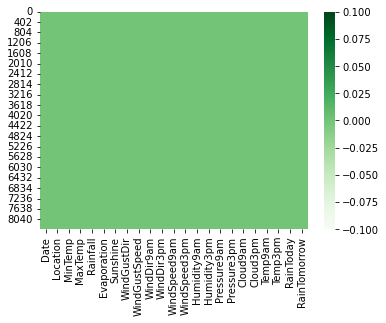

In [27]:
sns.heatmap(rain_data.isnull(), cmap="Greens")
plt.show()

In [28]:
rain_data.head(10).T

,0,1,2,3,4,5,6,7,8,9
Date,2008-12-01,2008-12-02,2008-12-03,2008-12-04,2008-12-05,2008-12-06,2008-12-07,2008-12-08,2008-12-09,2008-12-10
Location,Albury,Albury,Albury,Albury,Albury,Albury,Albury,Albury,Albury,Albury
MinTemp,13.4,7.4,12.9,9.2,17.5,14.6,14.3,7.7,9.7,13.1
MaxTemp,22.9,25.1,25.7,28.0,32.3,29.7,25.0,26.7,31.9,30.1
Rainfall,0.6,0.0,0.0,0.0,1.0,0.2,0.0,0.0,0.0,1.4
Evaporation,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0
Sunshine,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
WindGustDir,W,WNW,WSW,NE,W,WNW,W,W,NNW,W
WindGustSpeed,44.0,44.0,46.0,24.0,41.0,56.0,50.0,35.0,80.0,28.0
WindDir9am,W,NNW,W,SE,ENE,W,SW,SSE,SE,S


In [29]:
Category = ['RainTomorrow','RainToday','WindGustDir','WindDir9am','WindDir3pm','Sunshine','Evaporation']

In [30]:
rain_data.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [14]:
Numerical = rain_data.drop(['WindGustDir','WindDir9am','WindDir3pm','Sunshine','Evaporation'],axis=1,inplace=True)

# Plotting for viewing relation between them to avoid overfitting

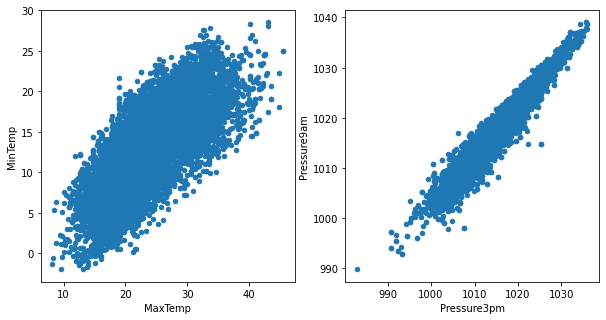

In [31]:
fig ,axs =plt.subplots(1,2)
rain_data.plot(kind='scatter',x='MaxTemp',y='MinTemp', ax=axs[0] ,figsize=(12,8))
rain_data.plot(kind='scatter',x='Pressure3pm',y='Pressure9am', ax=axs[1] ,figsize=(10,5))
fig.savefig('testdata.jpg')

In [32]:
rain_data.drop(['Pressure3pm'],axis=1,inplace=True)
rain_data.drop(['MinTemp'],axis=1,inplace=True)

In [33]:
# Using Label Encoder on categorical variable
from sklearn.preprocessing import LabelEncoder
label = LabelEncoder()
for i in Category:
    rain_data[i] = label.fit_transform(rain_data[i])
rain_data.head().T

,0,1,2,3,4
Date,2008-12-01,2008-12-02,2008-12-03,2008-12-04,2008-12-05
Location,Albury,Albury,Albury,Albury,Albury
MaxTemp,22.9,25.1,25.7,28.0,32.3
Rainfall,0.6,0.0,0.0,0.0,1.0
Evaporation,21,21,21,21,21
Sunshine,0,0,0,0,0
WindGustDir,13,14,15,4,13
WindGustSpeed,44.0,44.0,46.0,24.0,41.0
WindDir9am,13,6,13,9,1
WindDir3pm,14,15,15,0,7


# pairplot

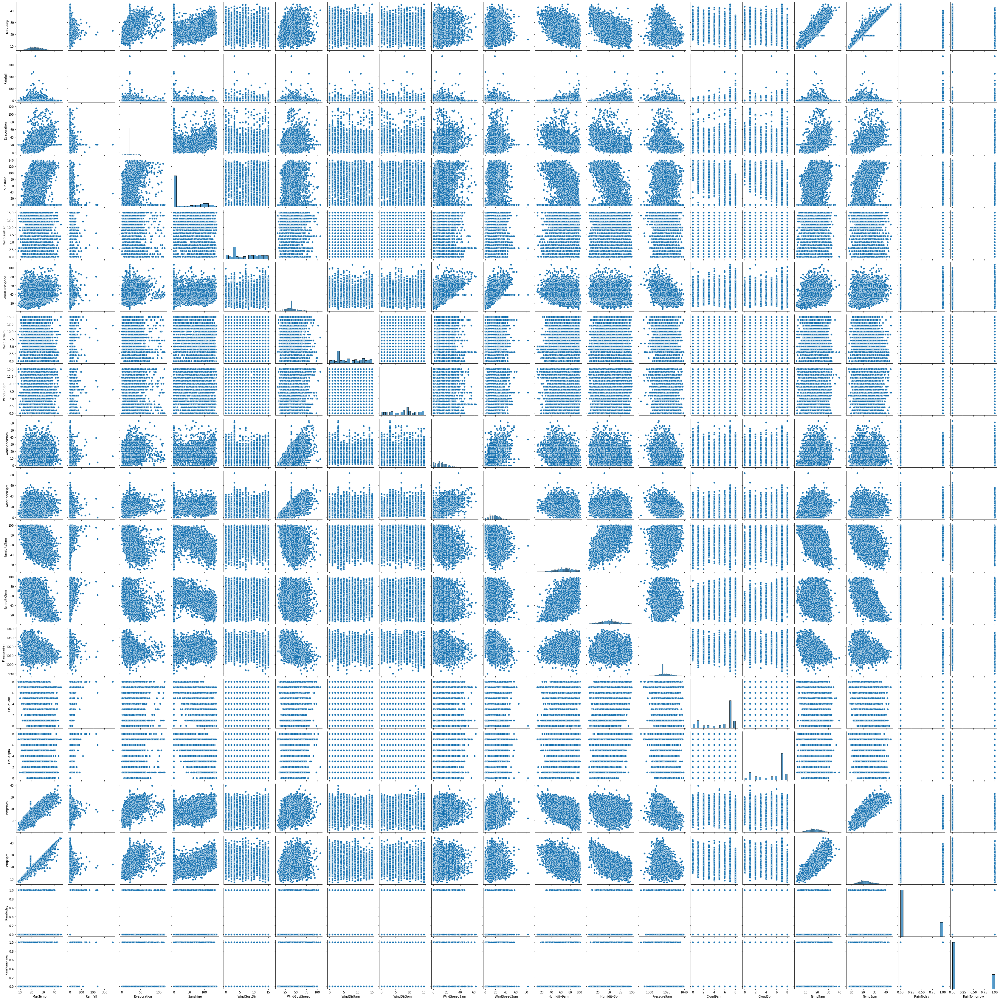

In [34]:
sns.pairplot(rain_data)

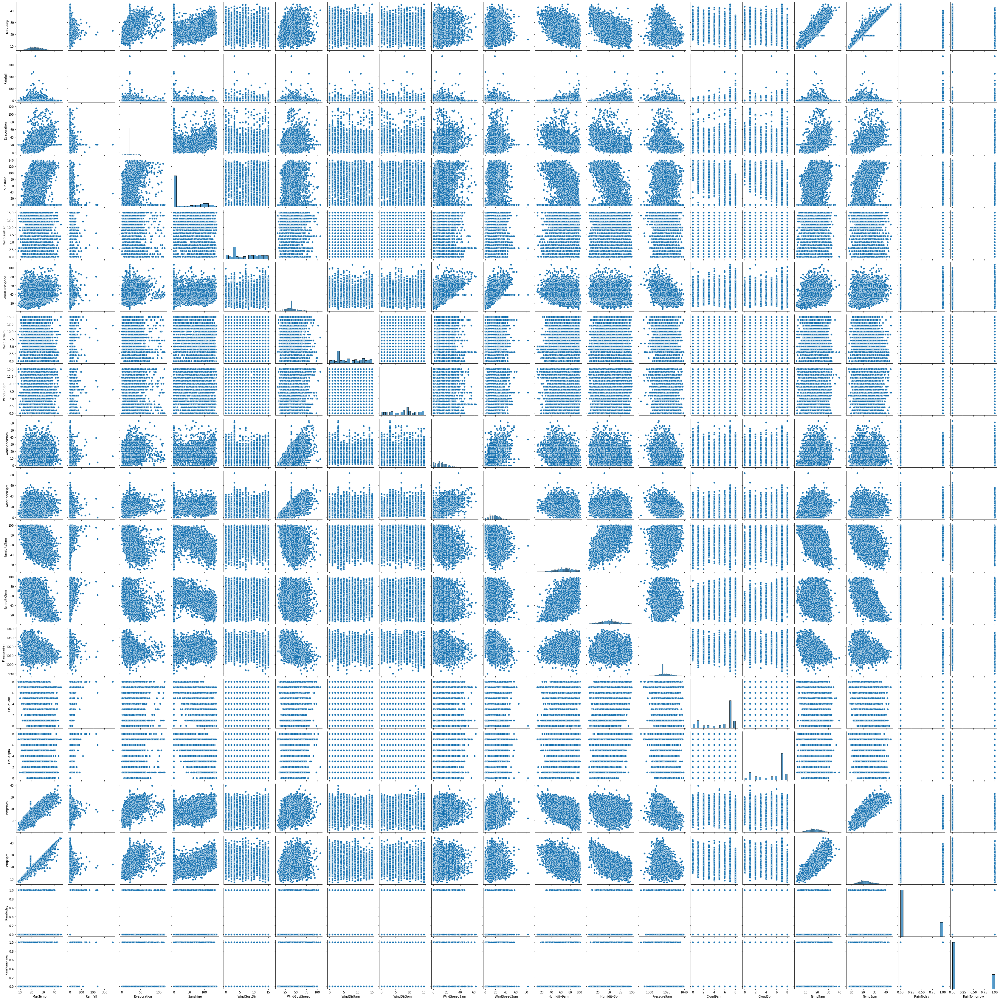

In [77]:
sns.pairplot(rain_data)

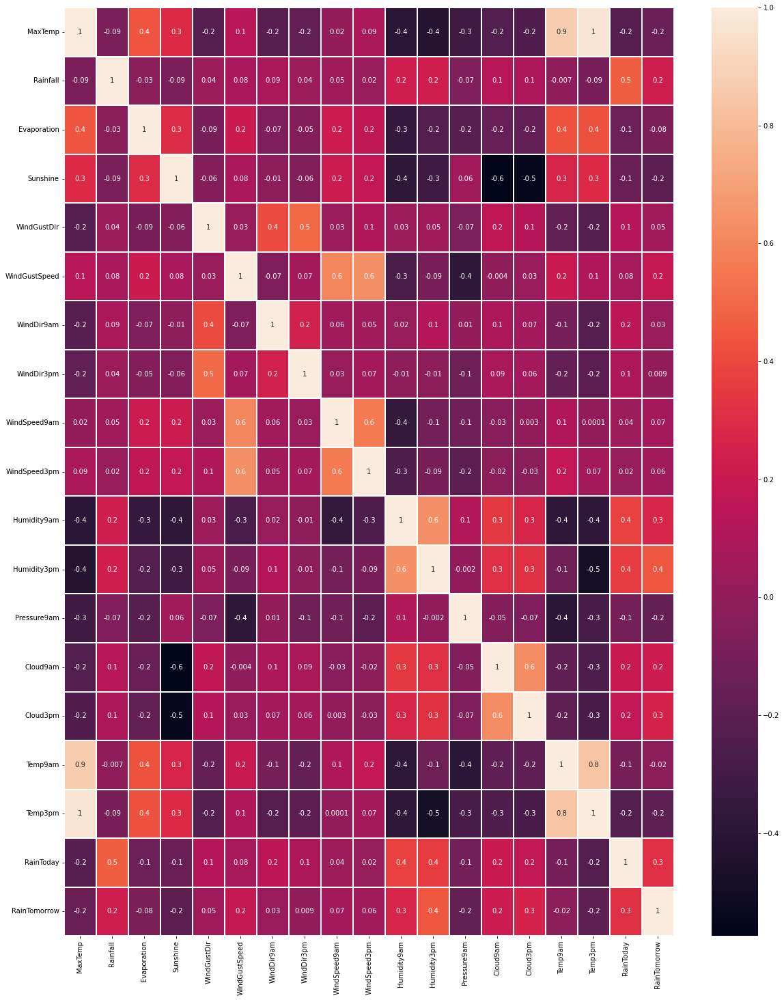

In [36]:
plt.figure(figsize=(20,25))
corr = rain_data.corr()
sns.heatmap(data=corr, annot=True, fmt='.1g' ,linewidth= 2)
plt.show()

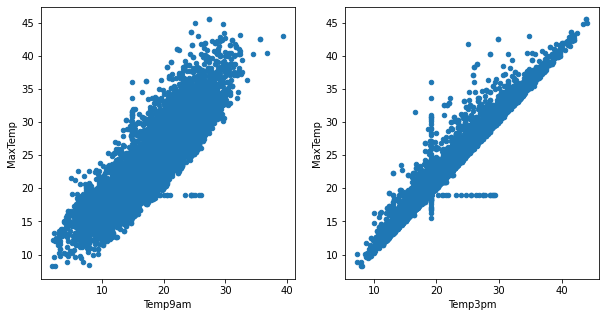

In [37]:
fig ,axs =plt.subplots(1,2)
rain_data.plot(kind='scatter',x='Temp9am',y='MaxTemp', ax=axs[0] ,figsize=(12,8))
rain_data.plot(kind='scatter',x='Temp3pm',y='MaxTemp', ax=axs[1] ,figsize=(10,5))
fig.savefig('testdata.jpg')

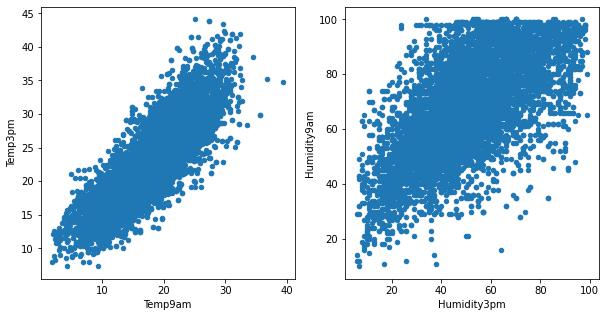

In [38]:
fig ,axs =plt.subplots(1,2)
rain_data.plot(kind='scatter',x='Temp9am',y='Temp3pm', ax=axs[0] ,figsize=(12,8))
rain_data.plot(kind='scatter',x='Humidity3pm',y='Humidity9am', ax=axs[1] ,figsize=(10,5))
fig.savefig('testdata.jpg')

In [39]:
rain_data.drop(['Temp9am'],axis=1,inplace=True)
rain_data.drop(['Temp3pm'],axis=1,inplace=True)

# Checking Correlation
Checking Correlation Now lets look at the correlation between all the numerical variables. We can use the corr() to compute pairwise correlation of columns, excluding NA/null values using pearson correlation coefficient. Then we will use the heat map to visualize the correlation. Heatmaps visualize data through variations in coloring. The variables with darker color means their correlation is more.

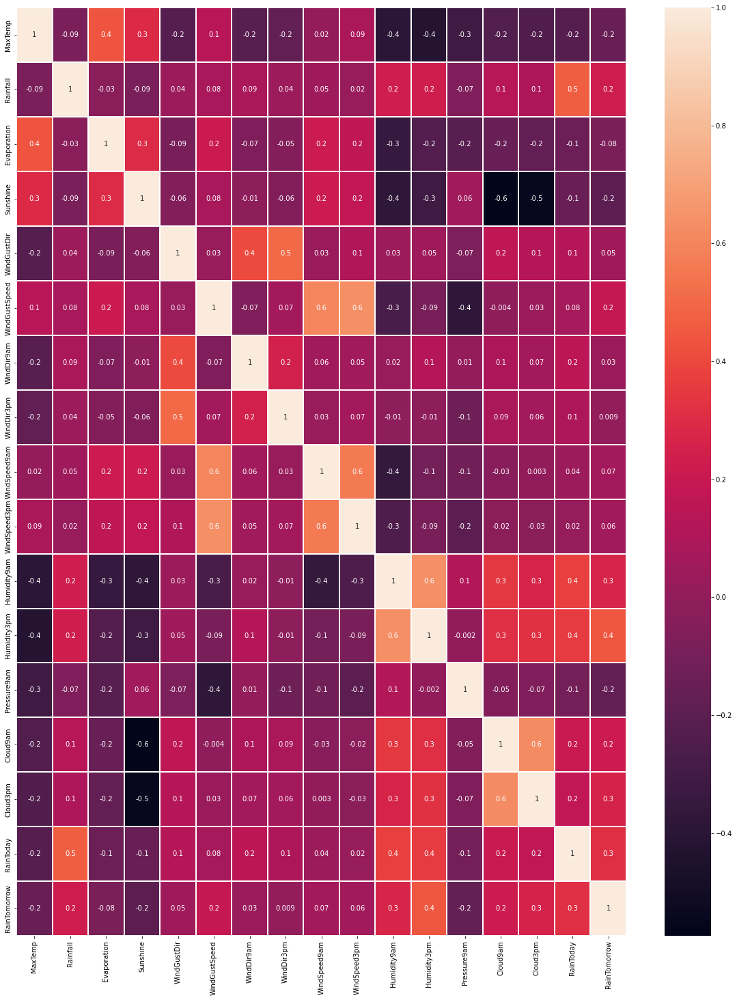

In [40]:
plt.figure(figsize=(20,25))
corr = rain_data.corr()
sns.heatmap(data=corr, annot=True, fmt='.1g' ,linewidth= 2)
plt.show()

In [41]:
rain_data

,Date,Location,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,22.9,0.6,21,0,13,44.0,13,14,20.0,24.0,71.0,22.0,1007.7,8.0,7.0,0,0
1,2008-12-02,Albury,25.1,0.0,21,0,14,44.0,6,15,4.0,22.0,44.0,25.0,1010.6,7.0,7.0,0,0
2,2008-12-03,Albury,25.7,0.0,21,0,15,46.0,13,15,19.0,26.0,38.0,30.0,1007.6,7.0,2.0,0,0
3,2008-12-04,Albury,28.0,0.0,21,0,4,24.0,9,0,11.0,9.0,45.0,16.0,1017.6,7.0,7.0,0,0
4,2008-12-05,Albury,32.3,1.0,21,0,13,41.0,1,7,7.0,20.0,82.0,33.0,1010.8,7.0,8.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,23.4,0.0,21,0,0,31.0,9,1,13.0,11.0,51.0,24.0,1024.6,7.0,7.0,0,0
8421,2017-06-22,Uluru,25.3,0.0,21,0,6,22.0,9,3,13.0,9.0,56.0,21.0,1023.5,7.0,7.0,0,0
8422,2017-06-23,Uluru,26.9,0.0,21,0,3,37.0,9,14,9.0,9.0,53.0,24.0,1021.0,7.0,7.0,0,0
8423,2017-06-24,Uluru,27.0,0.0,21,0,9,28.0,10,3,13.0,7.0,51.0,24.0,1019.4,3.0,2.0,0,0


In [43]:
rain_data.drop(['Location'],axis=1,inplace=True)
rain_data.drop(['Date'],axis=1,inplace=True)

# Checking outliers

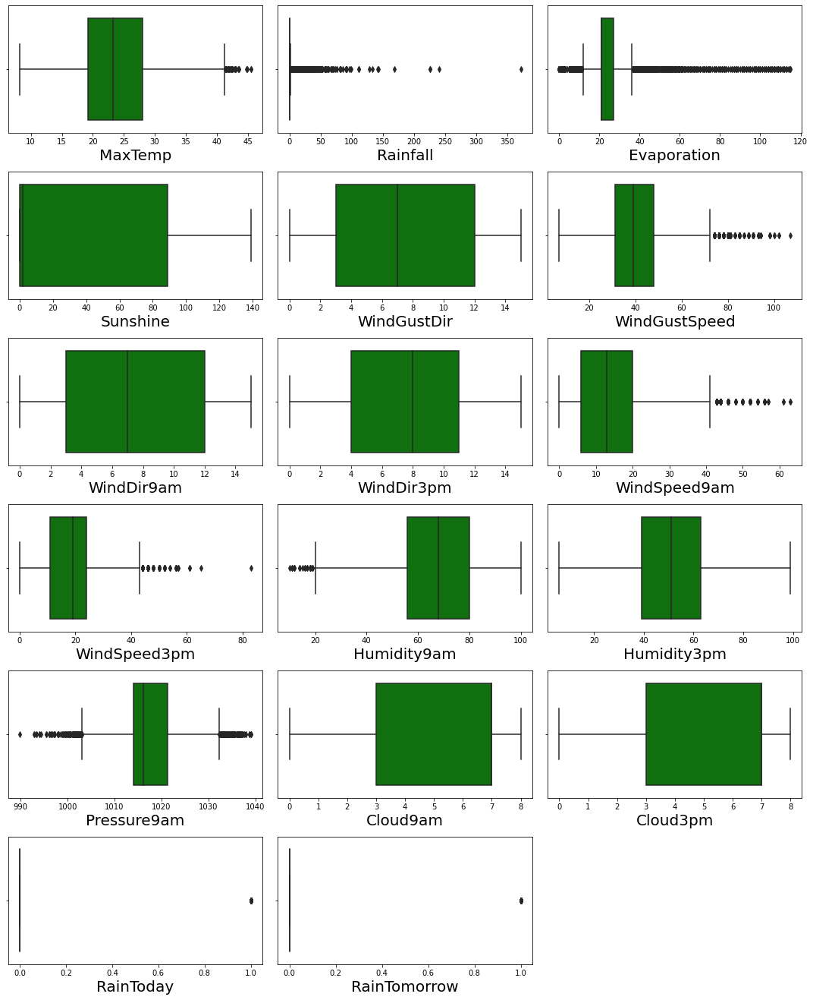

In [44]:
plt.figure(figsize=(15,30),facecolor='white')
plotnumber=1

for column in rain_data:
    if plotnumber<=29:
        ax=plt.subplot(10,3,plotnumber)
        sns.boxplot(rain_data[column],color='g')
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()
plt.show()

In [45]:
from scipy.stats import zscore
z = np.abs(zscore(rain_data))
threshold = 3
rain_data = rain_data[(z<3).all(axis = 1)]

In [46]:
rain_data.shape

(7940, 17)

# Checking Skewness of features

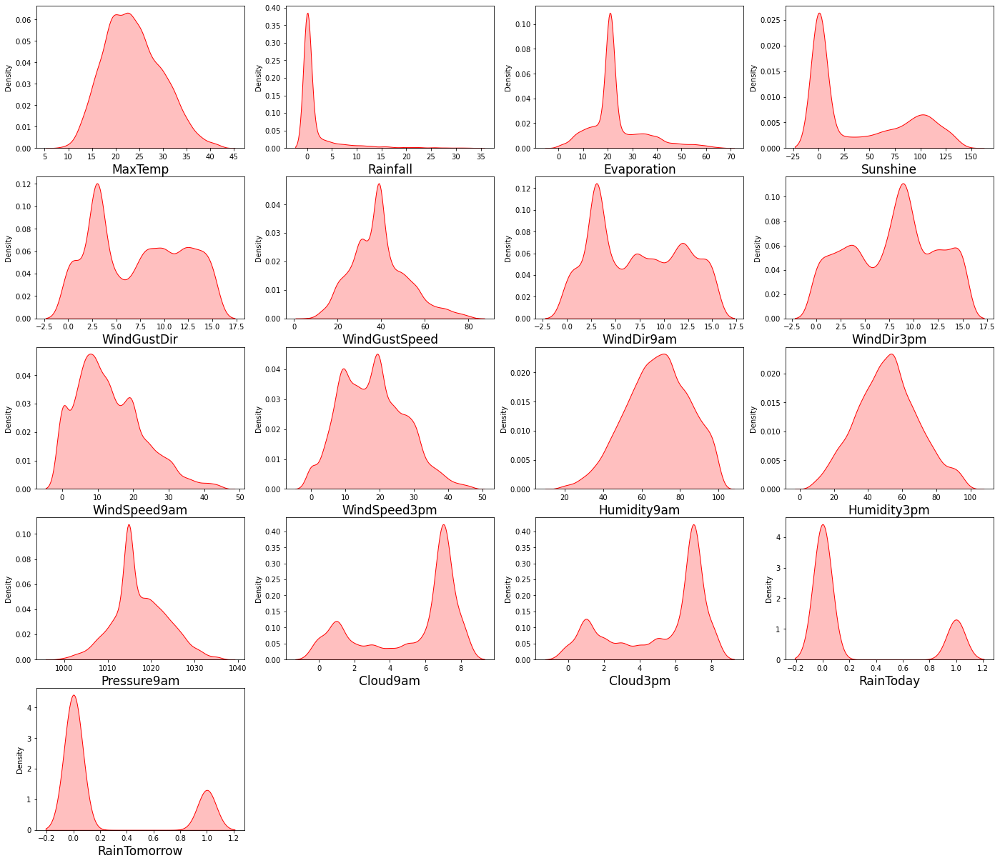

In [47]:
plt.figure(figsize=(24,30), facecolor='white')
plotnumber =1
for column in rain_data:
    if plotnumber<=28:
        ax= plt.subplot(7,4,plotnumber)
        sns.distplot(rain_data[column], color='r',hist=False,kde_kws={"shade": True})
        plt.xlabel(column,fontsize=17)
    plotnumber+=1
plt.show()

In [48]:
rain_data.skew()

MaxTemp          0.338713
Rainfall         3.524802
Evaporation      1.175883
Sunshine         0.603065
WindGustDir      0.106907
WindGustSpeed    0.541239
WindDir9am       0.160771
WindDir3pm      -0.129296
WindSpeed9am     0.716408
WindSpeed3pm     0.328038
Humidity9am     -0.230947
Humidity3pm      0.115535
Pressure9am      0.219786
Cloud9am        -0.848297
Cloud3pm        -0.783790
RainToday        1.298021
RainTomorrow     1.294611
dtype: float64

In [49]:
# Making the skew less than or equal to +0.5 and -0.5 for better prediction using yeo-johnson method
skew=['RainToday','Cloud9am','Evaporation','Rainfall','RainTomorrow','WindSpeed9am']

# Importing Powertransformer
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

# Transfroming skew data
rain_data[skew] = scaler.fit_transform(rain_data[skew].values)

In [50]:
rain_data.skew()

MaxTemp          0.338713
Rainfall         1.038035
Evaporation      0.106563
Sunshine         0.603065
WindGustDir      0.106907
WindGustSpeed    0.541239
WindDir9am       0.160771
WindDir3pm      -0.129296
WindSpeed9am    -0.110043
WindSpeed3pm     0.328038
Humidity9am     -0.230947
Humidity3pm      0.115535
Pressure9am      0.219786
Cloud9am        -0.653863
Cloud3pm        -0.783790
RainToday        1.298021
RainTomorrow     1.294611
dtype: float64

# Checking Correlation

In [51]:
rain_data.corr().T

,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,RainToday,RainTomorrow
MaxTemp,1.000000,-0.243453,0.495517,0.286100,-0.222855,0.126919,-0.206130,-0.183233,0.014187,0.094549,-0.376964,-0.407313,-0.322413,-0.238240,-0.239473,-0.216048,-0.148713
Rainfall,-0.243453,1.000000,-0.206483,-0.166214,0.131646,0.076987,0.154333,0.118970,0.028258,0.021628,0.405064,0.385622,-0.108539,0.215789,0.188755,0.932814,0.316428
Evaporation,0.495517,-0.206483,1.000000,0.297228,-0.098621,0.189362,-0.082007,-0.030011,0.156350,0.144117,-0.375984,-0.250870,-0.249147,-0.173363,-0.200644,-0.177067,-0.098771
Sunshine,0.286100,-0.166214,0.297228,1.000000,-0.039246,0.086357,0.005957,-0.047653,0.249340,0.193377,-0.387413,-0.308468,0.048534,-0.585393,-0.544139,-0.132788,-0.193589
WindGustDir,-0.222855,0.131646,-0.098621,-0.039246,1.000000,0.025655,0.402825,0.508445,0.089689,0.123890,0.021223,0.041167,-0.058380,0.155131,0.122939,0.119144,0.041465
WindGustSpeed,0.126919,0.076987,0.189362,0.086357,0.025655,1.000000,-0.059334,0.086411,0.541561,0.631733,-0.256853,-0.079662,-0.351077,-0.013379,0.013278,0.079173,0.183259
WindDir9am,-0.206130,0.154333,-0.082007,0.005957,0.402825,-0.059334,1.000000,0.240133,0.153009,0.070658,-0.002036,0.109586,0.017712,0.079725,0.059450,0.147527,0.027435
WindDir3pm,-0.183233,0.118970,-0.030011,-0.047653,0.508445,0.086411,0.240133,1.000000,0.047864,0.080552,-0.015280,-0.013467,-0.131460,0.077842,0.052894,0.099083,0.005225
WindSpeed9am,0.014187,0.028258,0.156350,0.249340,0.089689,0.541561,0.153009,0.047864,1.000000,0.554702,-0.358822,-0.088929,-0.067606,-0.041479,-0.018939,0.047263,0.059670
WindSpeed3pm,0.094549,0.021628,0.144117,0.193377,0.123890,0.631733,0.070658,0.080552,0.554702,1.000000,-0.242849,-0.078725,-0.167691,-0.025349,-0.036575,0.023768,0.045295


# Getting counts

In [52]:
rain_data.RainTomorrow.value_counts()

-0.543970    6127
 1.838337    1813
Name: RainTomorrow, dtype: int64

In [53]:
rain_data.Rainfall.value_counts()

-0.655344    5264
 0.038648     391
 0.475973     176
 0.770696     113
 1.250051      82
             ... 
 0.883504       1
 1.887164       1
 1.886935       1
 1.891333       1
 1.889597       1
Name: Rainfall, Length: 170, dtype: int64

In [65]:
X = rain_data.drop(columns = ['RainTomorrow'],axis=1)
Y = rain_data['RainTomorrow']

In [55]:
rain_data

,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,RainToday,RainTomorrow
0,22.9,0.770696,-0.100603,0,13,44.0,13,14,0.800165,24.0,71.0,22.0,1007.7,1.175610,7.0,-0.543192,-0.54397
1,25.1,-0.655344,-0.100603,0,14,44.0,6,15,-0.973979,22.0,44.0,25.0,1010.6,0.655149,7.0,-0.543192,-0.54397
2,25.7,-0.655344,-0.100603,0,15,46.0,13,15,0.715999,26.0,38.0,30.0,1007.6,0.655149,2.0,-0.543192,-0.54397
3,28.0,-0.655344,-0.100603,0,4,24.0,9,0,-0.049527,9.0,45.0,16.0,1017.6,0.655149,7.0,-0.543192,-0.54397
4,32.3,1.133265,-0.100603,0,13,41.0,1,7,-0.529369,20.0,82.0,33.0,1010.8,0.655149,8.0,-0.543192,-0.54397
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,23.4,-0.655344,-0.100603,0,0,31.0,9,1,0.160738,11.0,51.0,24.0,1024.6,0.655149,7.0,-0.543192,-0.54397
8421,25.3,-0.655344,-0.100603,0,6,22.0,9,3,0.160738,9.0,56.0,21.0,1023.5,0.655149,7.0,-0.543192,-0.54397
8422,26.9,-0.655344,-0.100603,0,3,37.0,9,14,-0.277676,9.0,53.0,24.0,1021.0,0.655149,7.0,-0.543192,-0.54397
8423,27.0,-0.655344,-0.100603,0,9,28.0,10,3,0.160738,7.0,51.0,24.0,1019.4,-1.014557,2.0,-0.543192,-0.54397


# Encoding categorical variable

In [6]:
# Using Label Encoder on  categorical variable
from sklearn.preprocessing import LabelEncoder
label = LabelEncoder()
for i in rain_data:
    rain_data[i] = label.fit_transform(rain_data[i])
rain_data.head().T

,0,1,2,3,4
Date,0,1,2,3,4
Location,1,1,1,1,1
MinTemp,149,89,144,107,190
MaxTemp,134,156,162,185,228
Rainfall,5,0,0,0,8
Evaporation,21,21,21,21,21
Sunshine,0,0,0,0,0
WindGustDir,13,14,15,4,13
WindGustSpeed,20,20,21,9,18
WindDir9am,13,6,13,9,1


# Split , Train , Test

In [66]:
X = rain_data.drop(columns = ['RainTomorrow'],axis=1)
Y = rain_data['RainTomorrow']

In [8]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, confusion_matrix,classification_report,f1_score

In [68]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, random_state=99, test_size=.3)
pritn('Training feature size:',X_train.shape)
print('Training target size:',Y_train.shape)
print('Test feature size:',X_test.shape)
print('Test target size:',Y_test.shape)

Training feature size: (5558, 16)
Training target size: (5558,)
Test feature size: (2382, 16)
Test target size: (2382,)


In [69]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix,classification_report,f1_score
maxAccu=0
maxRS=0
for i in range(1,250):
    X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size = 0.3, random_state=i)
    log_reg=LogisticRegression()
    log_reg.fit(X_train,Y_train)
    y_pred=log_reg.predict(X_test)
    acc=accuracy_score(Y_test,y_pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print('Best accuracy is', maxAccu ,'on Random_state', maxRS)

Best accuracy is 0.8303946263643996 on Random_state 119


# General function for train ,test,and predict if next day it will rain or not probability

In [70]:
def model_val(model,X,Y):
    X_train,X_test,Y_train,Y_test =  train_test_split(X,Y,test_size=.30,random_state=119)
    model.fit( X_train,Y_train)
    y_pred=model.predict(X_test)
    print("Accuracy is ", model.score(X_test,Y_test)*100)
    score= cross_val_score(model,X,Y,cv=5) 
    print("Cross validation score is ", np.mean(score)*100)

# Machine Learning Model Building

# Logistics Regression Model

In [71]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
model= LogisticRegression()
model_val(model,X,Y)

Accuracy is  83.03946263643996
Cross validation score is  80.27707808564232


# DecisionTreeClassifier

In [72]:
from sklearn.tree import DecisionTreeClassifier
model= DecisionTreeClassifier()
model_val(model,X,Y)
#classification_report(Y_test, y_pred)

Accuracy is  85.09655751469354
Cross validation score is  78.28715365239296


# Decision Tree
Decision tree is a type of supervised learning algorithm(having a pre-defined target variable) that is mostly used in classification problems. In this technique, we split the population or sample into two or more homogeneous sets(or sub-populations) based on most significant splitter / differentiator in input variables.

Decision trees use multiple algorithms to decide to split a node in two or more sub-nodes. The creation of sub-nodes increases the homogeneity of resultant sub-nodes. In other words, we can say that purity of the node increases with respect to the target variable.

# SVC

In [73]:
from sklearn.svm import SVC
model= SVC()
model_val(model,X,Y)

Accuracy is  83.92107472712007
Cross validation score is  81.72544080604534


# KNeighborsClassifier

In [74]:
from sklearn.neighbors import KNeighborsClassifier
model= KNeighborsClassifier()
model_val(model,X,Y)

Accuracy is  83.45927791771621
Cross validation score is  79.05541561712846


# RandomForestClassifier

In [75]:
from sklearn.ensemble import RandomForestClassifier
model= RandomForestClassifier()
model_val(model,X,Y)

Accuracy is  89.67254408060454
Cross validation score is  85.26448362720403


# Random Forest
RandomForest is a tree based bootstrapping algorithm wherein a certain no. of weak learners (decision trees) are combined to make a powerful prediction model. For every individual learner, a random sample of rows and a few randomly chosen variables are used to build a decision tree model. Final prediction can be a function of all the predictions made by the individual learners. In case of regression problem, the final prediction can be mean of all the predictions

# GradientBoostingClassifier

In [76]:
from sklearn.ensemble import GradientBoostingClassifier
model= GradientBoostingClassifier()
model_val(model,X,Y)

Accuracy is  85.97816960537364
Cross validation score is  82.8337531486146


# ExtraTreesClassifier

In [77]:
from sklearn.ensemble import ExtraTreesClassifier
model= ExtraTreesClassifier()
model_val(model,X,Y)

Accuracy is  89.21074727120067
Cross validation score is  85.27707808564232


# AdaBoostClassifier

In [78]:
from sklearn.ensemble import AdaBoostClassifier
model= AdaBoostClassifier()
model_val(model,X,Y)

Accuracy is  84.2989084802687
Cross validation score is  82.30478589420656


# SGDClassifier

In [79]:
from sklearn.linear_model import SGDClassifier
model= SGDClassifier()
model_val(model,X,Y)

Accuracy is  70.61293031066332
Cross validation score is  74.40806045340051


# Hyper Parameter Tuning : GridSearchCV

We will try to improve the accuracy by tuning the hyperparameters for this model. We will use grid search to get the optimized values of hyper parameters. GridSearch is a way to select the best of a family of hyper parameters, parametrized by a grid of parameters.

We will use GridSearchCV in sklearn.model_selection for an exhaustive search over specified parameter values for an estimator. GridSearchCV implements a “fit” and a “score” method. It also implements “predict”, “predict_proba”, “decision_function”, “transform” and “inverse_transform” if they are implemented in the estimator used.

In [80]:
from sklearn.model_selection import GridSearchCV
parameter= {'criterion' : ['gini', 'entropy'],
             'max_features':['auto','sqrt','log2'],
              'min_samples_split':[3,5,7,10],
              'max_depth' : [10,20],
              'n_estimators' : [100,200,300]
             }

In [81]:
GCV = GridSearchCV(ExtraTreesClassifier(),parameter,verbose=10)
GCV.fit(X_train,Y_train)

Fitting 5 folds for each of 144 candidates, totalling 720 fits
[CV 1/5; 1/144] START criterion=gini, max_depth=10, max_features=auto, min_samples_split=3, n_estimators=100
[CV 1/5; 1/144] END criterion=gini, max_depth=10, max_features=auto, min_samples_split=3, n_estimators=100;, score=0.844 total time=   0.2s
[CV 2/5; 1/144] START criterion=gini, max_depth=10, max_features=auto, min_samples_split=3, n_estimators=100
[CV 2/5; 1/144] END criterion=gini, max_depth=10, max_features=auto, min_samples_split=3, n_estimators=100;, score=0.849 total time=   0.2s
[CV 3/5; 1/144] START criterion=gini, max_depth=10, max_features=auto, min_samples_split=3, n_estimators=100
[CV 3/5; 1/144] END criterion=gini, max_depth=10, max_features=auto, min_samples_split=3, n_estimators=100;, score=0.832 total time=   0.2s
[CV 4/5; 1/144] START criterion=gini, max_depth=10, max_features=auto, min_samples_split=3, n_estimators=100
[CV 4/5; 1/144] END criterion=gini, max_depth=10, max_features=auto, min_samples_

GridSearchCV(estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 20],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_split': [3, 5, 7, 10],
                         'n_estimators': [100, 200, 300]},
             verbose=10)

In [82]:
GCV.best_params_

{'criterion': 'gini',
 'max_depth': 20,
 'max_features': 'log2',
 'min_samples_split': 3,
 'n_estimators': 300}

# Final Model for next day rain prediction

In [83]:
Final_mod = ExtraTreesClassifier(criterion='gini',n_estimators= 300, max_depth=20 ,
                                 min_samples_split= 3, max_features= 'log2')
Final_mod.fit(X_train,Y_train)
y_pred=Final_mod.predict(X_test)
print('\033[1m'+'Accuracy Score :'+'\033[0m\n', accuracy_score(Y_test, y_pred))

Accuracy Score :
 0.8866498740554156


In [85]:
import joblib
joblib.dump(Final_mod,'rain_tommorrow_Status.pkl')

['rain_tommorrow_Status.pkl']

# Split , Train , Test for Rain Quantity

In [10]:
X = rain_data.drop('Rainfall', axis=1)
Y = rain_data['Rainfall']

In [11]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, random_state=42, test_size=.33)
print('Training feature matrix size:',X_train.shape)
print('Training target vector size:',Y_train.shape)
print('Test feature matrix size:',X_test.shape)
print('Test target vector size:',Y_test.shape)

Training feature matrix size: (5644, 22)
Training target vector size: (5644,)
Test feature matrix size: (2781, 22)
Test target vector size: (2781,)


In [93]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
maxR2_score=0
maxRS=0
for i in range(1,1000):
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, random_state=i, test_size=.33)
    lin_reg=LinearRegression()
    lin_reg.fit(X_train,Y_train)
    y_pred=lin_reg.predict(X_test)
    R2=r2_score(Y_test,y_pred)
    if R2>maxR2_score:
        maxR2_score=R2
        maxRS=i
print('Best R2 Score is', maxR2_score ,'on Random_state', maxRS)

Best R2 Score is 0.5936613176598464 on Random_state 699


# LogisticRegression

In [94]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
model= LogisticRegression()
model_val(model,X,Y)

Accuracy is  65.3232577665827
Cross validation score is  65.75566750629723


# DecisionTreeClassifier

In [95]:
from sklearn.tree import DecisionTreeClassifier
model= DecisionTreeClassifier()
model_val(model,X,Y)
#classification_report(Y_test, y_pred)

Accuracy is  68.80772460117548
Cross validation score is  64.88664987405542


# SVC

In [ ]:
from sklearn.svm import SVC
model= SVC()
model_val(model,X,Y)

# KNeighborsClassifier

In [97]:
from sklearn.neighbors import KNeighborsClassifier
model= KNeighborsClassifier()
model_val(model,X,Y)

Accuracy is  63.0142737195634
Cross validation score is  62.35516372795969


# RandomForestClassifier

In [98]:
from sklearn.ensemble import RandomForestClassifier
model= RandomForestClassifier()
model_val(model,X,Y)

Accuracy is  75.06297229219143
Cross validation score is  73.94206549118388


# ExtraTreesClassifier

from sklearn.ensemble import ExtraTreesClassifier
model= ExtraTreesClassifier()
model_val(model,X,Y)

# AdaBoostClassifier

In [101]:
from sklearn.ensemble import AdaBoostClassifier
model= AdaBoostClassifier()
model_val(model,X,Y)

Accuracy is  65.3232577665827
Cross validation score is  67.2544080604534


# SGDClassifier

In [102]:
from sklearn.linear_model import SGDClassifier
model= SGDClassifier()
model_val(model,X,Y)

Accuracy is  64.65155331654073
Cross validation score is  51.3727959697733


# Hyper Parameter Tuning : GridSearchCV

In [104]:
parameter= {'criterion' : ['gini', 'entropy'],
             'max_features':['auto','sqrt','log2'],
              'min_samples_split':[3,5,7,10],
              'max_depth' : [10,20],
              'n_estimators' : [100,200,300]
             }

In [105]:
GCV = GridSearchCV(ExtraTreesClassifier(),parameter,verbose=10)
GCV.fit(X_train,Y_train)

Fitting 5 folds for each of 144 candidates, totalling 720 fits
[CV 1/5; 1/144] START criterion=gini, max_depth=10, max_features=auto, min_samples_split=3, n_estimators=100
[CV 1/5; 1/144] END criterion=gini, max_depth=10, max_features=auto, min_samples_split=3, n_estimators=100;, score=0.718 total time=   1.0s
[CV 2/5; 1/144] START criterion=gini, max_depth=10, max_features=auto, min_samples_split=3, n_estimators=100
[CV 2/5; 1/144] END criterion=gini, max_depth=10, max_features=auto, min_samples_split=3, n_estimators=100;, score=0.715 total time=   1.0s
[CV 3/5; 1/144] START criterion=gini, max_depth=10, max_features=auto, min_samples_split=3, n_estimators=100
[CV 3/5; 1/144] END criterion=gini, max_depth=10, max_features=auto, min_samples_split=3, n_estimators=100;, score=0.735 total time=   1.1s
[CV 4/5; 1/144] START criterion=gini, max_depth=10, max_features=auto, min_samples_split=3, n_estimators=100
[CV 4/5; 1/144] END criterion=gini, max_depth=10, max_features=auto, min_samples_

GridSearchCV(estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 20],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_split': [3, 5, 7, 10],
                         'n_estimators': [100, 200, 300]},
             verbose=10)

In [106]:
GCV.best_params_

{'criterion': 'entropy',
 'max_depth': 20,
 'max_features': 'sqrt',
 'min_samples_split': 3,
 'n_estimators': 100}

# Final Model for  rain Quantity

In [107]:
Final_mod = ExtraTreesClassifier(criterion='entropy',n_estimators= 100, max_depth=20 ,
                                 min_samples_split= 3, max_features= 'sqrt')
Final_mod.fit(X_train,Y_train)
y_pred=Final_mod.predict(X_test)
print('\033[1m'+'Accuracy Score :'+'\033[0m\n', accuracy_score(Y_test, y_pred))

Accuracy Score :
 0.7451354444868371


# Save Model

In [108]:
import joblib
joblib.dump(Final_mod,'rain_quantity_Status.pkl')

['rain_quantity_Status.pkl']